# 🐶 End-to-end Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TesorFlow 2.0 and TensorFlow Hub.

## 1. Problem
Identifying the breed of a dog given an image of a dog.

## 2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed for each of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set. (This images have labels)
* There are around 10,000+ images in the test set.
(This images have no labels, because we'll want to predict them).

### Get our workspace ready

* Import TensorFlow ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF version:", hub.__version__)

# Check for GPU availability
print("GPU", "availability" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.12.0
TF version: 0.14.0
GPU availability


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (like matrix).

Let's start by accessing our data and checking out the labels.

In [ ]:
# Access the data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/labels.csv")

In [ ]:
labels_csv.describe

<bound method NDFrame.describe of                                      id                     breed
0      000bec180eb18c7604dcecc8fe0dba07               boston_bull
1      001513dfcb2ffafc82cccf4d8bbaba97                     dingo
2      001cdf01b096e06d78e9e5112d419397                  pekinese
3      00214f311d5d2247d5dfe4fe24b2303d                  bluetick
4      0021f9ceb3235effd7fcde7f7538ed62          golden_retriever
...                                 ...                       ...
10217  ffd25009d635cfd16e793503ac5edef0                    borzoi
10218  ffd3f636f7f379c51ba3648a9ff8254f            dandie_dinmont
10219  ffe2ca6c940cddfee68fa3cc6c63213f                  airedale
10220  ffe5f6d8e2bff356e9482a80a6e29aac        miniature_pinscher
10221  fff43b07992508bc822f33d8ffd902ae  chesapeake_bay_retriever

[10222 rows x 2 columns]>

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

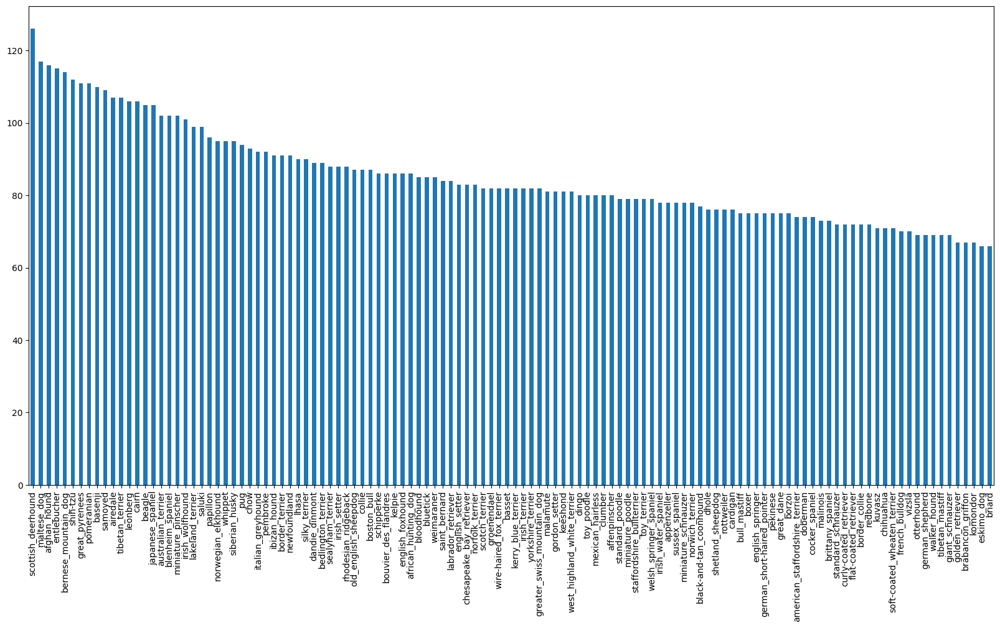

In [ ]:
# How many images are there for each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
# Average of images of each dog's breed
labels_csv["breed"].value_counts().mean()

85.18333333333334

In [ ]:
# Median of images of each dog's breed
labels_csv["breed"].value_counts().median()

82.0

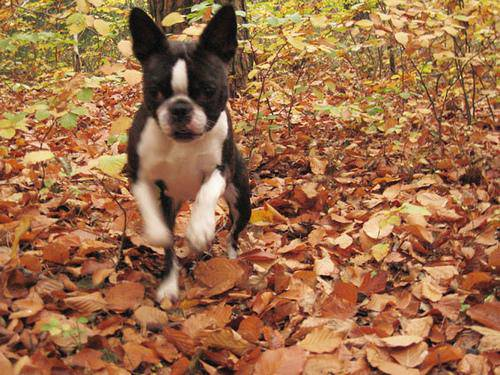

In [ ]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [ ]:
# Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/train/" + fname + ".jpg"  for fname in labels_csv["id"]]

# Check the first top 5
filenames[:5]

['/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [ ]:
# check whether number of filenames matches number of actual image files
import os

# check the file length
if len(os.listdir("drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/train/")) == len(filenames):
  print("Filenames match actual amount of files")
else:
  print("Filenames do not match actual amount of files")

Filenames match actual amount of files


Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Matches")
else:
  print("Don't matches")

Matches


In [ ]:
# Find the unique labels
unique_breeds = np.unique(labels)
unique_breeds, len(unique_breeds)

(array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle',
        'bedlington_terrier', 'bernese_mountain_dog',
        'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
        'bluetick', 'border_collie', 'border_terrier', 'borzoi',
        'boston_bull', 'bouvier_des_flandres', 'boxer',
        'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
        'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
        'chow', 'clumber', 'cocker_spaniel', 'collie',
        'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
        'doberman', 'english_foxhound', 'english_setter',
        'english_springer', 'entlebucher', 'eskimo_dog',
        'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
        'german_short-haired_pointer', 'giant_schnauzer',
        'golden_retriever', 'gordon_setter', 'gre

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])

labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Check that the 20 position matches
unique_breeds[19]

'boston_bull'

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # find the unique_breed that matches
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # 1 = sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
# Check how the bool label's look like
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Creating our own validation set
Since the dataset from Kaggle doesn't come with validation set, we're going to create our own.

In [ ]:
# Setup X & y
X = filenames[:1000]
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Split into train and validation sets
from  sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:2], y_train[:2]

(['/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, 

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function wich does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224, 224)
5. Return the modify `image`

Before we do, let's see what importing an image looks like

In [ ]:
# Convert an image
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [ ]:
# Tensor, the only different is that now is able to run in a GPU
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our `image` (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modify `image`

In [ ]:
tensor = tf.io.read_file(filenames[0])
tensor = tf.image.decode_jpeg(tensor, channels=3)[:2]
tensor = tf.image.convert_image_dtype(tensor, tf.float32)
tensor

<tf.Tensor: shape=(2, 500, 3), dtype=float32, numpy=
array([[[0.41960788, 0.1764706 , 0.        ],
        [0.5921569 , 0.35686275, 0.16078432],
        [0.69411767, 0.4666667 , 0.27058825],
        ...,
        [0.6862745 , 0.56078434, 0.26666668],
        [0.7411765 , 0.6156863 , 0.32156864],
        [0.8352942 , 0.70980394, 0.4156863 ]],

       [[0.5882353 , 0.36078432, 0.18039216],
        [0.7019608 , 0.47450984, 0.29411766],
        [0.6431373 , 0.43137258, 0.24705884],
        ...,
        [0.654902  , 0.53333336, 0.21960786],
        [0.67058825, 0.54901963, 0.23529413],
        [0.73333335, 0.6117647 , 0.29803923]]], dtype=float32)>

In [ ]:
# Define the image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """

  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpg image into numerical Tensor with RGB
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the colour channel value from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples wich look like this:
`(image, label)`,

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and return a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's maek a function to turn all of our data (X & y) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels)
  """

  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices( (tf.constant(X), # filepaths
                                              tf.constant(y)) ) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # If it's a training batch
  else:
    print("Creating training databatches...")
    # Turn filepaths into Tensors
    data = tf.data.Dataset.from_tensor_slices( (tf.constant(X), # filepaths
                                          tf.constant(y)) ) # labels
    # Shuffling pathnames and labels before maping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (also turn image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [ ]:
# Creating training and validation databatches
train_data = create_data_batches(X_train, y_train)
valid_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training databatches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing DataBatches

Our data is now in batches however this can be a litte hard to understand/comprehend, let's visualze them!

In [ ]:
import matplotlib.pyplot as plt

# create a function to viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Set up figure
  plt.figure(figsize=(10, 10))
  # Loop through 25
  for i in range(25):
    # Create subplots
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title( unique_breeds[labels[i].argmax()] )
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

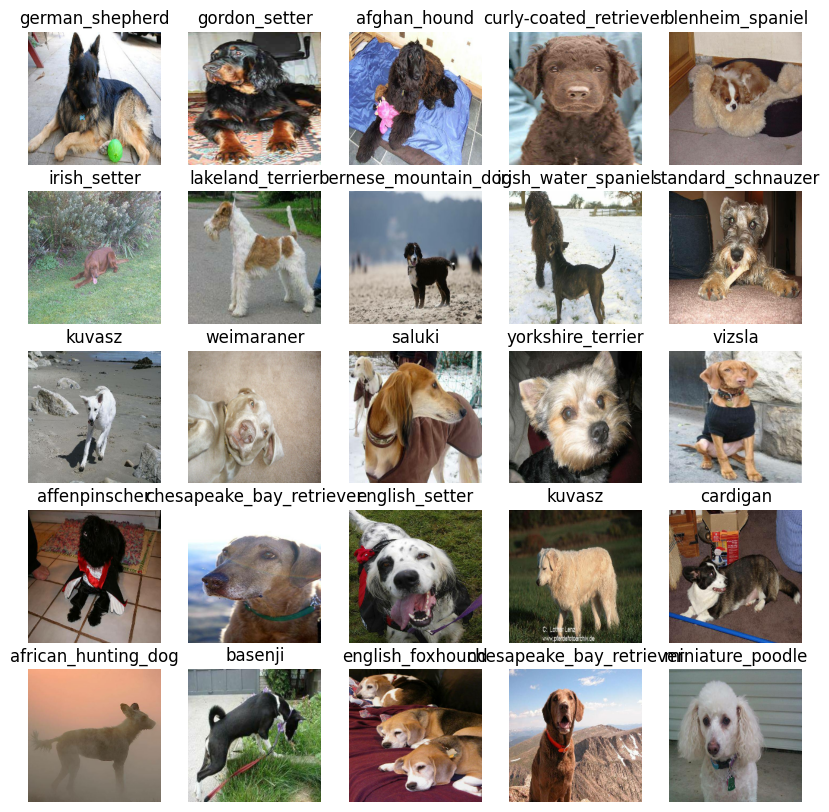

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

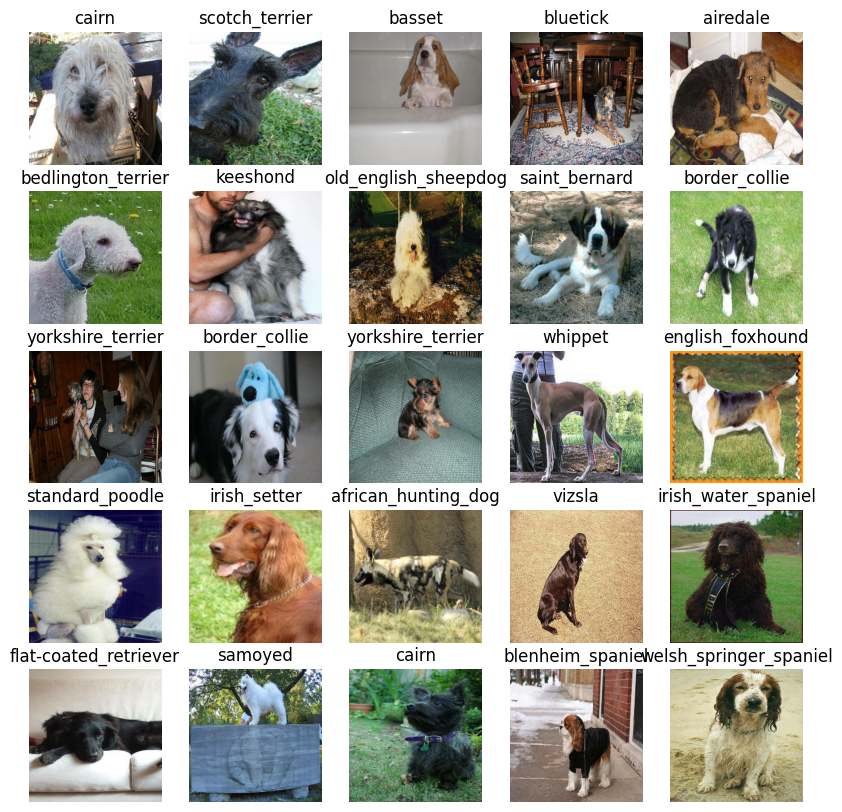

In [ ]:
# Now let's visualize our vaidation set
val_images, val_labels = next(valid_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:

* The input shape (our images shape in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [33]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function wich:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Return the model.

In [ ]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # Setup the model layers
  m = tf.keras.Sequential([
            hub.KerasLayer(MODEL_URL),
            tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                  activation="softmax")
          ])

  # Compile the model
  m.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  m.build(INPUT_SHAPE)

  # Return the model
  return m

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard wich helps track our models progress and another for early stopping wich prevents our model from training for too long.

### TensorBoard Callback

To setup a tensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension.✅
2. Create a TensorBoard which is able to save logs to a directory and pas it to our model's `fit()` function.✅
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).✅

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [34]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join('/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/logs',
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early Stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [35]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [36]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [37]:
# Check to make sure we still running on a GPU
print("GPU available") if tf.config.list_physical_devices("GPU") else "not available"

GPU available


Let's create a function wich trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, calidation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [38]:
# Build a function to train and return that model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data parsing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 176s 6s/step - loss: 4.5970 - accuracy: 0.0913 - val_loss: 3.5505 - val_accuracy: 0.2250
Epoch 2/100
25/25 [==============================] - 5s 210ms/step - loss: 1.6636 - accuracy: 0.6762 - val_loss: 2.2527 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 4s 150ms/step - loss: 0.5770 - accuracy: 0.9287 - val_loss: 1.7289 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 4s 147ms/step - loss: 0.2604 - accuracy: 0.9825 - val_loss: 1.5167 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 3s 124ms/step - loss: 0.1501 - accuracy: 0.9962 - val_loss: 1.4276 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 4s 151ms/step - loss: 0.1018 - accuracy: 1.0000 - val_loss: 1.3777 - val_accuracy: 0.6350
Epoch 7/100
25/25 [==============================

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Colab\ Notebooks/Dog\ Vision\ (DL)/dog-breed-identification/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(valid_data, verbose=1)
predictions

7/7 [==============================] - 1s 101ms/step


array([[9.9694100e-04, 2.8696279e-05, 2.4716218e-04, ..., 1.0393466e-03,
        2.0594309e-05, 2.5189265e-03],
       [3.0280629e-03, 1.7978592e-03, 1.3417424e-02, ..., 4.3586831e-04,
        1.1771919e-03, 2.9200743e-04],
       [3.1225234e-06, 1.1453092e-04, 1.9951920e-05, ..., 1.4225737e-04,
        3.0153718e-05, 1.1765163e-03],
       ...,
       [2.3415951e-06, 1.1341236e-05, 2.1485341e-05, ..., 9.9362505e-06,
        8.7477085e-05, 1.3320846e-05],
       [1.1051549e-03, 1.9753262e-04, 2.9923129e-05, ..., 4.6063753e-05,
        6.1619416e-05, 1.3927631e-03],
       [2.0566994e-04, 5.2760552e-05, 6.9800083e-04, ..., 8.4024426e-03,
        1.2254136e-02, 1.9262737e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val), len(unique_breeds)

(200, 120)

In [ ]:
# First prediction
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[9.96941002e-04 2.86962786e-05 2.47162185e-04 7.61965857e-05
 8.94420737e-05 7.78331832e-06 5.41479001e-03 2.74539983e-04
 7.86946839e-05 4.89334983e-04 1.83515338e-04 7.74538057e-05
 1.93748303e-04 1.97276313e-05 4.77075781e-04 4.14471608e-04
 4.48526516e-05 3.89748335e-01 6.98311169e-06 1.05616855e-05
 2.88759300e-04 6.78149299e-05 5.74665792e-05 9.54944873e-04
 1.07092710e-05 4.00047284e-04 3.07900697e-01 1.75952751e-04
 2.53550941e-04 1.49622661e-04 2.32427585e-04 1.86375971e-03
 2.04082084e-04 2.48476827e-05 1.17410491e-04 2.97192112e-02
 7.28061968e-06 3.06489892e-05 3.93300288e-05 7.84394797e-05
 1.70004275e-03 3.86109923e-06 9.42144561e-06 2.10537954e-04
 1.27197682e-05 6.34901298e-05 3.32237541e-05 2.46917061e-05
 5.86445618e-04 1.55747723e-04 1.27753461e-04 3.22490523e-05
 4.18341719e-04 1.95816901e-05 6.99742232e-05 4.90522943e-05
 4.38372168e-04 2.60135537e-04 1.12216687e-03 9.83029790e-03
 4.42244091e-05 1.91264571e-05 1.93380588e-03 3.65905453e-06
 1.29582375e-04 2.638538

In [ ]:
np.argmax(predictions[0]), unique_breeds[26]

(17, 'cairn')

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also know as confidence levels.

In [39]:
# Turn predictions probabilities into their respetive label (easier to understand)
def get_pred_label( prediction_probabilities ):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

In [ ]:
# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label( predictions[0] ) # Expects 'cairn'
pred_label

'border_terrier'

In [ ]:
valid_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [40]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in valid_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'border_terrier'

We can see how our model got right the prediction of the 1st element.

Now let's functionalize this...

In [41]:
def unbatchify(batched_data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in batched_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  # Return the arrays
  return images, labels

In [ ]:
# unbatchify the validation data
val_images, val_labels = unbatchify(valid_data)

In [ ]:
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[8])

'affenpinscher'

In [ ]:
get_pred_label(predictions[8])

'saint_bernard'

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function wich:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.✅
* Convert the prediction probabilities to a predicted label.✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.✅

In [42]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of predicition and truth label
  plt.title(f"{pred_label} {np.max(pred_prob)*100:2.0f}% => {true_label}",color=color)


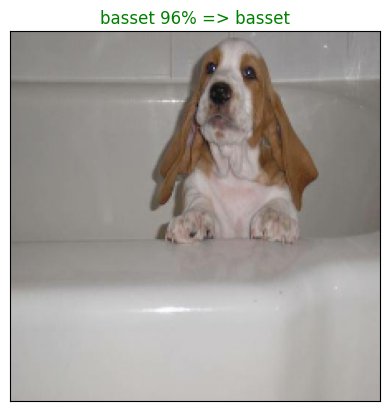

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=2)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions

This function will:
* Take an input of a predicton probabilities array and a ground truth array and an integer ✅
* Find the prediction using `get_pred_label()` ✅
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green and the wrong one red. ✅


In [43]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth labels for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar( np.arange(len(top_10_pred_labels)),
                      top_10_pred_values,
                      color="grey" )
  plt.xticks( np.arange(len(top_10_pred_labels)),
              labels=top_10_pred_labels,
              rotation="vertical")

  # Change the color of the true and wrong labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

Code used in function to get the 10 higher prediction indexes (More explained)

In [ ]:
predictions[0]

array([9.96941002e-04, 2.86962786e-05, 2.47162185e-04, 7.61965857e-05,
       8.94420737e-05, 7.78331832e-06, 5.41479001e-03, 2.74539983e-04,
       7.86946839e-05, 4.89334983e-04, 1.83515338e-04, 7.74538057e-05,
       1.93748303e-04, 1.97276313e-05, 4.77075781e-04, 4.14471608e-04,
       4.48526516e-05, 3.89748335e-01, 6.98311169e-06, 1.05616855e-05,
       2.88759300e-04, 6.78149299e-05, 5.74665792e-05, 9.54944873e-04,
       1.07092710e-05, 4.00047284e-04, 3.07900697e-01, 1.75952751e-04,
       2.53550941e-04, 1.49622661e-04, 2.32427585e-04, 1.86375971e-03,
       2.04082084e-04, 2.48476827e-05, 1.17410491e-04, 2.97192112e-02,
       7.28061968e-06, 3.06489892e-05, 3.93300288e-05, 7.84394797e-05,
       1.70004275e-03, 3.86109923e-06, 9.42144561e-06, 2.10537954e-04,
       1.27197682e-05, 6.34901298e-05, 3.32237541e-05, 2.46917061e-05,
       5.86445618e-04, 1.55747723e-04, 1.27753461e-04, 3.22490523e-05,
       4.18341719e-04, 1.95816901e-05, 6.99742232e-05, 4.90522943e-05,
      

In [ ]:
# to access to the order, from the higher to the lower we use argsort()
predictions[0].argsort()

array([ 63,  41,  18,  36,  69,   5,  42,  92,  19,  24,  44, 108,  61,
        53,  13, 118, 115,  47,  33, 113,  99,   1,  37,  88,  51,  46,
        38, 107,  94,  60,  16,  87,  75,  55, 114,  91,  22, 112,  45,
        21, 101,  54,  71,   3,  11,  39,   8,   4,  80, 111,  34,  50,
        64,  29,  49,  90,  27,  66,  10, 105,  72,  12, 110,  32,  43,
        30,  85,   2,  84,  28,  57,   7, 104,  20,  67,  96,  78,  81,
        95,  25,  15,  89,  52,  56,  82,  14,   9,  86,  48,  76,  23,
         0, 117,  74,  58,  98,  40, 116,  31,  62, 119,  83, 102,  68,
       100,  93,   6,  97,  59,  77,  70, 109, 106,  73,  65,  35,  79,
       103,  26,  17])

In [ ]:
# The top 10 values of that array
predictions[0].argsort()[-10:][::-1]

array([ 17,  26, 103,  79,  35,  65,  73, 106, 109,  70])

In [ ]:
# get the values of those indexes in prediction
predictions[0][ predictions[0].argsort()[-10:][::-1] ]

array([0.38974833, 0.3079007 , 0.04611688, 0.03106099, 0.02971921,
       0.02638538, 0.02325829, 0.01979787, 0.01902663, 0.01829128],
      dtype=float32)

In [ ]:
# Higher value is on index 59
predictions[0][59]

0.009830298

In [ ]:
# another way...
predictions[0].argmax(), predictions[0].max()

(17, 0.38974833)

Testing the function

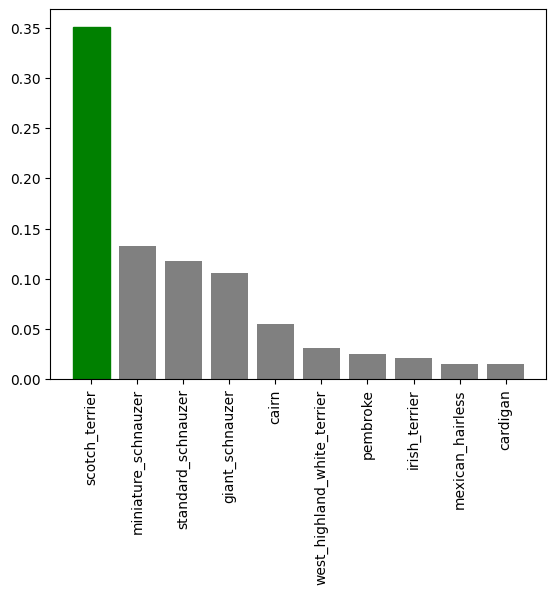

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=1)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.

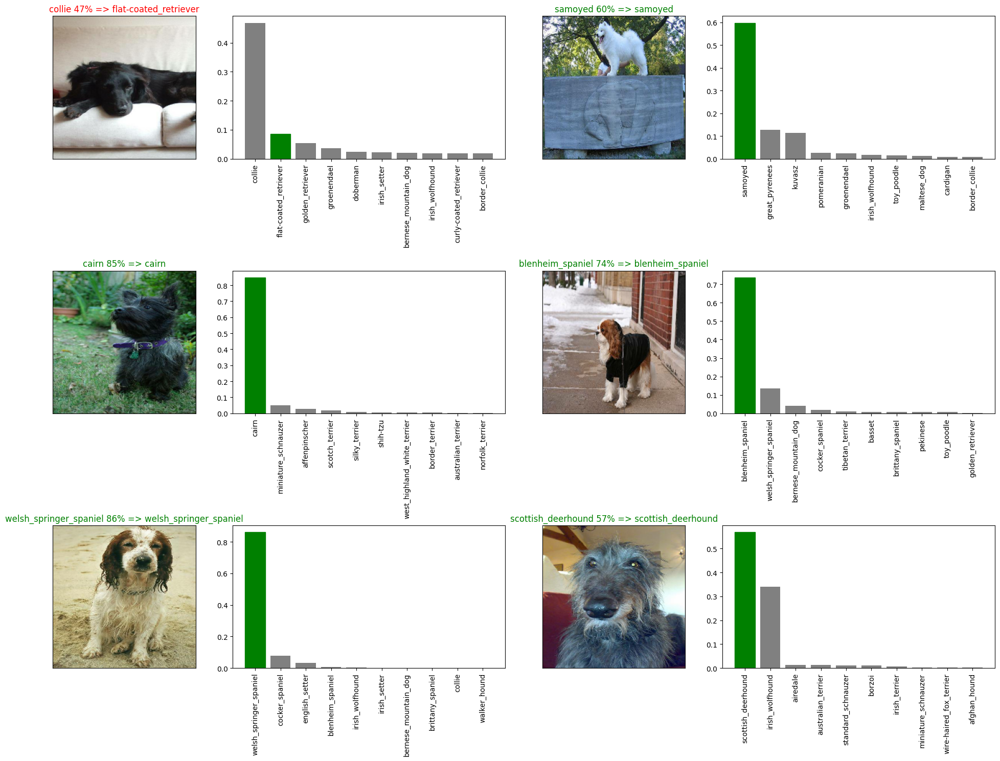

In [ ]:
# Let's check out a few predictions and ther different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Save a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join('/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/models',
                          datetime.datetime.now().strftime("%Y%m%d - %H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [44]:
# Create a sunction to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}...")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got function to save and load a model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
model_path = save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/models/20230727 - 15121690470725-1000-images-mobilenetv2-Adam.h5...


In [ ]:
# Load model
loaded_model = load_model(model_path)

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/models/20230727 - 15121690470725-1000-images-mobilenetv2-Adam.h5...


In [ ]:
# Evaluate the pre-saved model
model.evaluate(valid_data)

7/7 [==============================] - 1s 81ms/step - loss: 1.2651 - accuracy: 0.6550


[1.265081763267517, 0.6549999713897705]

In [ ]:
# Evaluate the loaded model
loaded_model.evaluate(valid_data)

7/7 [==============================] - 1s 90ms/step - loss: 1.2651 - accuracy: 0.6550


[1.265081763267517, 0.6549999713897705]

In [45]:
X = filenames

In [ ]:
X[:2]

['/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg']

## Traininig a big dog model (on the full data)

In [46]:
len(X), len(y)

(10222, 10222)

In [47]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training databatches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [48]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

NameError: ignored

**Note:** Running the cell below will take a little while ( maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 41s 111ms/step - loss: 1.3259 - accuracy: 0.6708
Epoch 2/100
320/320 [==============================] - 36s 113ms/step - loss: 0.3976 - accuracy: 0.8801
Epoch 3/100
320/320 [==============================] - 37s 116ms/step - loss: 0.2326 - accuracy: 0.9375
Epoch 4/100
320/320 [==============================] - 37s 114ms/step - loss: 0.1534 - accuracy: 0.9627
Epoch 5/100
320/320 [==============================] - 36s 111ms/step - loss: 0.1044 - accuracy: 0.9800
Epoch 6/100
320/320 [==============================] - 50s 158ms/step - loss: 0.0772 - accuracy: 0.9869
Epoch 7/100
320/320 [==============================] - 35s 110ms/step - loss: 0.0576 - accuracy: 0.9924
Epoch 8/100
320/320 [==============================] - 53s 166ms/step - loss: 0.0463 - accuracy: 0.9938
Epoch 9/100
320/320 [==============================] - 38s 120ms/step - loss: 0.0363 - accuracy: 0.9970
Epoch 10/100
320/320 [==============================] - 45s 138m

In [ ]:
full_model_file_path = save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/models/20230727 - 15421690472576-full-image-set-mobilenetv2-Adam.h5...


In [ ]:
# Load in the full model
loaded_full_model = load_model(full_model_file_path)

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/models/20230727 - 15421690472576-full-image-set-mobilenetv2-Adam.h5...


## Making predictions the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we  created `create_data_batches()` earlier wich can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames. ✅
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels). ✅
* Make a predictions array by passing the test batches to the `predict()` method called on our model. ✅

In [ ]:
# Load test image filenames
test_path = '/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/test/e00a1b26edd5cb7323e3b75ce37b36f6.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/test/dfc0659b3b6eff35dc50d2501f1ea247.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/test/e7feb64da6aae1ef8e62453f6660d0c5.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/test/e34654831e228ad3ac1d0c463e70caf6.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/test/e61cd2626c01dd00117eca55fb099f5d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/test/e66a91249a4979a86db48e5c64b81a88.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/test/e726ac27864ecbde1f5822c4d6e26c17.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/test/e5fa615e36dc3b2b3f554aa5097a6ec

In [ ]:
len(test_filenames)

10377

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run...

In [ ]:
# Make predictions on test data batch using the loaded_full_model
test_predictions = loaded_full_model.predict(test_data,
                                              verbose=1)

325/325 [==============================] - 3638s 11s/step


In [ ]:
# Save predictons (NumPy array) to csv file (for access later)
np.savetxt('/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/preds_array.csv', test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt('/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/preds_array.csv', delimiter=",")

In [ ]:
test_predictions[:10]

array([[4.19187384e-12, 7.99648703e-09, 7.49600555e-12, ...,
        7.34865835e-10, 5.79935795e-06, 1.74252321e-07],
       [2.95071079e-09, 3.86329940e-10, 6.00982208e-10, ...,
        4.70534056e-09, 6.57034676e-08, 2.27498659e-03],
       [5.15352703e-08, 4.09000859e-06, 1.21164057e-08, ...,
        3.68945088e-08, 3.83687571e-08, 1.25294406e-04],
       ...,
       [1.95574179e-09, 6.80672602e-11, 2.01324966e-08, ...,
        1.89873802e-07, 4.97509461e-07, 3.08037966e-06],
       [2.32238961e-09, 3.14155646e-10, 3.28929906e-09, ...,
        1.30872017e-12, 5.92334385e-12, 6.79138873e-04],
       [3.80838427e-13, 8.12947420e-13, 5.60097921e-13, ...,
        1.95252106e-10, 2.66526870e-11, 1.63666108e-12]])

In [ ]:
test_predictions.shape

(10377, 120)

## Preparing test dataset predictions for Kaggle

Looking at the kaggle sample submition, we find that it wants our models prediction probability outputs in a DataFrame with an ID a column for each different dog breed. https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas DataFrame with and ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
["id"] + list(unique_breeds)

['id',
 'affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenen

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append image id's to prediction df
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [ ]:
test_ids

['e00a1b26edd5cb7323e3b75ce37b36f6',
 'dfc0659b3b6eff35dc50d2501f1ea247',
 'e7feb64da6aae1ef8e62453f6660d0c5',
 'e34654831e228ad3ac1d0c463e70caf6',
 'e61cd2626c01dd00117eca55fb099f5d',
 'e66a91249a4979a86db48e5c64b81a88',
 'e726ac27864ecbde1f5822c4d6e26c17',
 'e5fa615e36dc3b2b3f554aa5097a6ece',
 'e293d06016cac647cd289e2008a4623a',
 'e19900119c7d3ce48d4035cd0211be72',
 'e5a89b25873ada7aaafec0de1af86cb1',
 'ea23e5341ec5fc3f798ae527a4659d81',
 'f0138bdbeba02c23bef5eebd81fcf3ec',
 'f3ea1d71874433a4fe775deb9e95923a',
 'e8e6e731b4afb84faf9c022a67935867',
 'ecba66c5313a2a5fd4017a039a9501b6',
 'f18141846c17b423f3f1df37ef294138',
 'f11821f2a5777c36a4081588fb96798f',
 'f191370aae3cc8e282cfd72ecdcc2226',
 'f46c9b6ddea9aa7ff685604eec44f67a',
 'f5a6e430c2c363335d22ae0593d7533a',
 'e90d5b1d2617510402f3620721f7c526',
 'e9f806911b69ca8fe705006ab7b49bdf',
 'eb2e408930e0873deb85484ef46f07fd',
 'f16eed64196d24c423f0a68d7ebf287d',
 'efdf443fb4a6ad5964c18d6676f36652',
 'eac53a0ba2df1689f98f8e7f8ebb90c2',
 

In [ ]:
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e00a1b26edd5cb7323e3b75ce37b36f6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dfc0659b3b6eff35dc50d2501f1ea247,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7feb64da6aae1ef8e62453f6660d0c5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e34654831e228ad3ac1d0c463e70caf6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e61cd2626c01dd00117eca55fb099f5d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e00a1b26edd5cb7323e3b75ce37b36f6,4.191874e-12,7.996487e-09,7.496006e-12,4.614742e-07,5.582190e-10,5.349021e-10,4.641794e-07,1.528461e-08,4.930119e-06,...,2.561676e-10,3.224572e-11,5.162795e-06,1.553887e-05,2.239873e-09,1.238312e-09,1.116327e-11,7.348658e-10,5.799358e-06,1.742523e-07
1,dfc0659b3b6eff35dc50d2501f1ea247,2.950711e-09,3.863299e-10,6.009822e-10,7.646640e-03,1.050762e-03,1.507235e-02,9.217054e-03,4.434471e-07,1.969078e-07,...,5.651119e-08,1.432835e-04,1.091695e-06,2.275831e-04,1.223608e-07,3.234670e-05,1.507765e-06,4.705341e-09,6.570347e-08,2.274987e-03
2,e7feb64da6aae1ef8e62453f6660d0c5,5.153527e-08,4.090009e-06,1.211641e-08,3.578340e-08,8.300960e-07,3.917056e-07,1.828124e-06,2.739756e-07,3.138911e-08,...,5.726383e-03,3.800277e-08,2.647451e-06,3.080077e-08,6.657756e-07,3.662010e-08,1.733024e-09,3.689451e-08,3.836876e-08,1.252944e-04
3,e34654831e228ad3ac1d0c463e70caf6,1.214993e-09,2.788852e-11,1.856106e-09,3.410678e-10,9.692119e-01,1.332807e-08,1.836590e-07,1.325252e-06,7.459378e-09,...,3.426085e-06,2.405367e-10,6.331948e-07,2.884086e-07,8.963751e-11,3.070496e-10,1.620578e-08,3.928317e-05,3.001912e-08,1.500554e-09
4,e61cd2626c01dd00117eca55fb099f5d,4.339810e-08,4.402652e-02,1.366803e-09,5.613522e-07,1.027187e-07,1.097155e-08,4.297859e-05,9.853992e-07,3.525084e-09,...,1.569219e-04,1.731294e-10,2.216176e-10,3.106985e-04,1.566491e-06,5.425698e-01,1.099104e-06,9.931345e-03,5.720855e-07,1.617866e-05


In [ ]:
preds_df = preds_df[:10357]

In [ ]:
# Export it to csv
preds_df.to_csv('/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/full_model_predictions_submission_official_mobilenetv2.csv',
                index=False)

## Making predictions on customize images

To make prdictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into databatches using `create_data_batches()`. And since our custmo images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [49]:
# Load in the full model
full_model_path = '/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/models/20230727 - 15421690472576-full-image-set-mobilenetv2-Adam.h5'
loaded_full_model = load_model(full_model_path)

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/models/20230727 - 15421690472576-full-image-set-mobilenetv2-Adam.h5...


In [50]:
loaded_full_model

In [55]:
# Get custom image filepaths
import os
custom_path = '/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/my-dog-photos/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [56]:
custom_image_paths

['/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/my-dog-photos/2.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/my-dog-photos/3.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog Vision (DL)/dog-breed-identification/my-dog-photos/1.jpg']

In [59]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [60]:
# Make predictions on our custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 11s 11s/step


In [62]:
custom_preds.shape

(3, 120)

In [63]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]

In [64]:
custom_pred_labels

['beagle', 'toy_terrier', 'american_staffordshire_terrier']

In [65]:
# Get custom images
custom_images = []
# Loop through ubatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

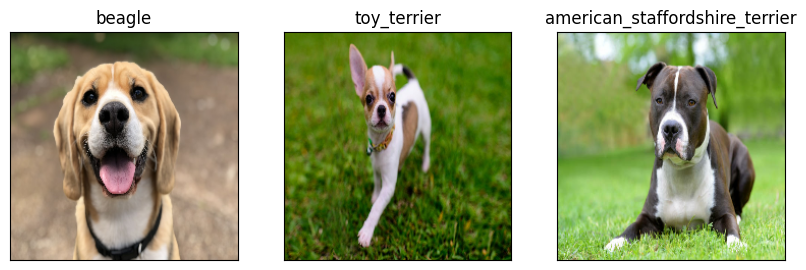

In [68]:
# Check custom image predictions
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)